# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_4:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [2]:
project_data = pd.read_csv('train_data.csv',nrows=50000)
resource_data = pd.read_csv('resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)


Number of data points in train data (50000, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


In [5]:
project_data["project_is_approved"].value_counts()

1    42286
0     7714
Name: project_is_approved, dtype: int64

## 1.2 preprocessing of `project_subject_categories`

In [6]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [7]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

### 1.2.7 Univariate Analysis: Text features (Project Essay's)

In [8]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

### 1.2.8 Univariate Analysis: Cost per project

In [9]:
# we get the cost of the project using resource.csv file
resource_data.head(2)

,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


In [10]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21


In [11]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

print(project_data)

       Unnamed: 0       id                        teacher_id teacher_prefix  \
0          160221  p253737  c90749f5d961ff158d4b4d1e7dc665fc           Mrs.   
1          140945  p258326  897464ce9ddc600bced1151f324dd63a            Mr.   
2           21895  p182444  3465aaf82da834c0582ebd0ef8040ca0            Ms.   
3              45  p246581  f3cb9bffbba169bef1a77b243e620b60           Mrs.   
4          172407  p104768  be1f7507a41f8479dc06f047086a39ec           Mrs.   
5          141660  p154343  a50a390e8327a95b77b9e495b58b9a6e           Mrs.   
6           21147  p099819  9b40170bfa65e399981717ee8731efc3           Mrs.   
7           94142  p092424  5bfd3d12fae3d2fe88684bbac570c9d2            Ms.   
8          112489  p045029  487448f5226005d08d36bdd75f095b31           Mrs.   
9          158561  p001713  140eeac1885c820ad5592a409a3a8994            Ms.   
10          43184  p040307  363788b51d40d978fe276bcb1f8a2b35           Mrs.   
11         127083  p251806  4ba7c721133ef651ca54a035

[50000 rows x 20 columns]


In [12]:
approved_price = project_data[project_data['project_is_approved']==1]['price'].values
print
rejected_price = project_data[project_data['project_is_approved']==0]['price'].values

## 1.3 Text preprocessing

### 1.3.1 Essay Text

In [13]:
project_data.head(2)


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.6,23
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.0,1


In [14]:
# printing some random essays.
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)



My students are English learners that are working on English as their second or third languages. We are a melting pot of refugees, immigrants, and native-born Americans bringing the gift of language to our school. \r\n\r\n We have over 24 languages represented in our English Learner program with students at every level of mastery.  We also have over 40 countries represented with the families within our school.  Each student brings a wealth of knowledge and experiences to us that open our eyes to new cultures, beliefs, and respect.\"The limits of your language are the limits of your world.\"-Ludwig Wittgenstein  Our English learner's have a strong support system at home that begs for more resources.  Many times our parents are learning to read and speak English along side of their children.  Sometimes this creates barriers for parents to be able to help their child learn phonetics, letter recognition, and other reading skills.\r\n\r\nBy providing these dvd's and players, students are ab

In [15]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [16]:
sent = decontracted(project_data['essay'].values[4000])
print(sent)
print("="*50)

I teach language arts and social studies to about 50 students each day.  I teach two groups of amazing kids each day!\r\n\r\nThe students in my classroom range from advanced or gifted learners to students with various learning disabilities. My school is located in an urban environment in Maryland. The school is a Title I (low-income) school, and 99% of the students in the school receive free and reduced price lunch. All students at my school receive free breakfast which is the most important meal of the day!High interest reading supports comprehension and learning. I want to encourage a love of reading by choosing books that interest my third grade students. Many of my students are classified as \"struggling readers\". There is extensive research to support the premise that the best way to become a better reader is to read more. In order for my students to become better or more fluent readers I need to increase both the quantity and quality of their reading.  They need reading material

In [17]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

I teach language arts and social studies to about 50 students each day.  I teach two groups of amazing kids each day!    The students in my classroom range from advanced or gifted learners to students with various learning disabilities. My school is located in an urban environment in Maryland. The school is a Title I (low-income) school, and 99% of the students in the school receive free and reduced price lunch. All students at my school receive free breakfast which is the most important meal of the day!High interest reading supports comprehension and learning. I want to encourage a love of reading by choosing books that interest my third grade students. Many of my students are classified as  struggling readers . There is extensive research to support the premise that the best way to become a better reader is to read more. In order for my students to become better or more fluent readers I need to increase both the quantity and quality of their reading.  They need reading materials that

In [18]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

I teach language arts and social studies to about 50 students each day I teach two groups of amazing kids each day The students in my classroom range from advanced or gifted learners to students with various learning disabilities My school is located in an urban environment in Maryland The school is a Title I low income school and 99 of the students in the school receive free and reduced price lunch All students at my school receive free breakfast which is the most important meal of the day High interest reading supports comprehension and learning I want to encourage a love of reading by choosing books that interest my third grade students Many of my students are classified as struggling readers There is extensive research to support the premise that the best way to become a better reader is to read more In order for my students to become better or more fluent readers I need to increase both the quantity and quality of their reading They need reading materials that they can read and wi

In [19]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [20]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [01:11<00:00, 697.16it/s]


In [21]:
# after preprocesing
preprocessed_essays[2000]

project_data['essay']=pd.DataFrame(preprocessed_essays)

<h3><font color='red'>1.3.2 Project title Text</font></h3>

In [22]:
# similarly you can preprocess the titles also

# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_titles.append(sent.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████| 50000/50000 [00:04<00:00, 12227.39it/s]


In [23]:
preprocessed_titles[2000]

project_data['project_title']=pd.DataFrame(preprocessed_titles)

## 1. 4 Preparing data for models

In [24]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category', 'project_title',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay', 'price',
       'quantity'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data
       
       - quantity : numerical
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

In [25]:
grades = list(project_data['project_grade_category'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
grades_list = []
for i in grades:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        j = j.replace(' ','_') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('-','_') # we are replacing the & value into 
        temp = temp.replace('Grades','grades') # we are replacing the & value into 
        temp = temp.replace('PreK','prek') # we are replacing the & value into 
    grades_list.append(temp.strip())
    
project_data['project_grade_category'] = grades_list




# Assignment 10: Clustering

- <font color='red'>step 1</font>: Choose any vectorizer (data matrix) that you have worked in any of the assignments, and got the best AUC value.
- <font color='red'>step 2</font>: Choose any of the <a href='https://scikit-learn.org/stable/modules/feature_selection.html'>feature selection</a>/<a href='https://scikit-learn.org/stable/modules/decomposition.html'>reduction algorithms</a> ex: selectkbest features, pretrained word vectors, model based feature selection etc and reduce the number of features to 5k features
- <font color='red'>step 3</font>: Apply all three kmeans, Agglomerative clustering, DBSCAN
    - <strong>K-Means Clustering:</strong> <br>
        ● Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)<br>
    - <strong>Agglomerative Clustering: </strong><br>
        ● Apply <a href='https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/'>agglomerative algorithm</a> and try a different number of clusters like 2,5 etc. <br>
        ● You can take less data points (as this is very computationally expensive one) to perform hierarchical clustering because they do take a considerable amount of time to run. <br>
    - <strong>DBSCAN Clustering: </strong><br>
        ● Find the best ‘eps’ using the <a href='https://stackoverflow.com/a/48558030/4084039'>elbow-knee method</a>.<br>
        ● You can take a smaller sample size for this as well.
- <font color='red'>step 4</font>: Summarize each cluster by manually observing few points from each cluster.
- <font color='red'>step 5</font>: You need to plot the word cloud with essay text for each cluster for each of algorithms mentioned in <font color='red'>step 3</font>.

<h1>2. Clustering </h1>

<h2>2.1 Choose the best data matrix on which you got the best AUC</h2>

In [26]:
X=project_data

In [27]:
X.head()

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,grades_prek_2,educational support english learners home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,my students english learners working english s...,154.60,23
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,grades_6_8,wanted projector hungry learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,our students arrive school eager learn they po...,299.00,1
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,grades_6_8,soccer equipment awesome middle school students,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports,Health_Wellness TeamSports,true champions not always ones win guts by mia...,516.85,22
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,grades_prek_2,techie kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,1,Literacy_Language Math_Science,Literacy Mathematics,i work unique school filled esl english second...,232.90,4
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,grades_prek_2,interactive math tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,1,Math_Science,Mathematics,our second grade classroom next year made arou...,67.98,4


<h2>2.2 Make Data Model Ready: encoding numerical, categorical features</h2>

<B>Normalizing the numerical features: Price</B>

In [28]:
from sklearn.preprocessing import Normalizer
normalizer_price = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead:
# array=[105.22 215.96 96.01 ... 368.98 80.53 709.67].
# Reshape your data either using
# array.reshape(-1, 1) if your data has a single feature
# array.reshape(1, -1) if it contains a single sample.
normalizer_price.fit(X['price'].values.reshape(-1,1))
X_price_norm = normalizer_price.transform(X['price'].values.reshape(-1,1))
print("After vectorizations")
print(X_price_norm.shape)
print("="*100)

After vectorizations
(50000, 1)


<B> Normalizing the numerical features: Previously posted projects</B>

In [29]:
from sklearn.preprocessing import Normalizer
normalizer_ppp = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead:
# array=[105.22 215.96 96.01 ... 368.98 80.53 709.67].
# Reshape your data either using
# array.reshape(-1, 1) if your data has a single feature
# array.reshape(1, -1) if it contains a single sample.
normalizer_ppp.fit(X['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_ppp_norm = normalizer_ppp.transform(X['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
print("After vectorizations")
print(X_ppp_norm.shape)
print("="*100)

After vectorizations
(50000, 1)


<B> Normalizing the numerical features : Quantity</B>

In [30]:
from sklearn.preprocessing import Normalizer
normalizer_qty = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead:
# array=[105.22 215.96 96.01 ... 368.98 80.53 709.67].
# Reshape your data either using
# array.reshape(-1, 1) if your data has a single feature
# array.reshape(1, -1) if it contains a single sample.
normalizer_qty.fit(X['quantity'].values.reshape(-1,1))
X_qty_norm = normalizer_qty.transform(X['quantity'].values.reshape(-1,1))

print("After vectorizations")

print(X_qty_norm.shape)

print("="*100)

After vectorizations
(50000, 1)


<B> One hot encoding the catogorical features: State</B>

In [31]:
vectorizer_schoolstate = CountVectorizer(lowercase=False, binary=True)
vectorizer_schoolstate.fit(X['school_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_state_ohe = vectorizer_schoolstate.transform(X['school_state'].values)

print("After vectorizations")
print(X_state_ohe.shape)

print(vectorizer_schoolstate.get_feature_names())
print("="*100)

stateVec=vectorizer_schoolstate.get_feature_names()
type(stateVec)


After vectorizations
(50000, 51)
['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY']


list

<B> One hot encoding the catogorical features: Project Grade</B>

In [32]:

uniqueData=X['project_grade_category'].unique()
print(uniqueData)


vectorizer_grade = CountVectorizer()
vectorizer_grade.fit(X['project_grade_category'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_grade_ohe = vectorizer_grade.transform(X['project_grade_category'].values)

print("After vectorizations")
print(X_grade_ohe.shape)

print(vectorizer_grade.get_feature_names())
print("="*100)

projGradeVec=vectorizer_grade.get_feature_names()

['grades_prek_2' 'grades_6_8' 'grades_3_5' 'grades_9_12']
After vectorizations
(50000, 4)
['grades_3_5', 'grades_6_8', 'grades_9_12', 'grades_prek_2']


<B> One hot encoding the catogorical features: Teacher Prefix</B>

In [33]:

#replacing nan with empty string
X.teacher_prefix=X.teacher_prefix.fillna('')

uniqueData=X['teacher_prefix'].unique()
print(uniqueData)

vectorizer_teachprefix = CountVectorizer(lowercase=False, binary=True)
vectorizer_teachprefix.fit(X['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_teacher_ohe = vectorizer_teachprefix.transform(X['teacher_prefix'].values)

print("After vectorizations")
print(X_teacher_ohe.shape)

print(vectorizer_teachprefix.get_feature_names())
print("="*100)

prefixteacherVec=vectorizer_teachprefix.get_feature_names()

['Mrs.' 'Mr.' 'Ms.' 'Teacher' '' 'Dr.']
After vectorizations
(50000, 5)
['Dr', 'Mr', 'Mrs', 'Ms', 'Teacher']


<B>One hot encoding the catogorical features: Clean categories</B>

In [34]:
vectorizer_cleancat = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_cleancat.fit(X['clean_categories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_ccat_ohe = vectorizer_cleancat.transform(X['clean_categories'].values)

print("After vectorizations")
print(X_ccat_ohe.shape)

print(vectorizer_cleancat.get_feature_names())
print("="*100)

cleanCatVec=vectorizer_cleancat.get_feature_names()

After vectorizations
(50000, 9)
['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']


<B> One hot encoding the catogorical features: Cleab subcategories</B>

In [35]:
vectorizer_cleansubcat = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_cleansubcat.fit(X['clean_subcategories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_csub_ohe = vectorizer_cleansubcat.transform(X['clean_subcategories'].values)

print("After vectorizations")
print(X_csub_ohe.shape)

print(vectorizer_cleansubcat.get_feature_names())
print("="*100)

cleansubCatVec=vectorizer_cleansubcat.get_feature_names()

After vectorizations
(50000, 30)
['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']


<h2>2.3 Make Data Model Ready: encoding essay, and project_title</h2>

<B> Bag of Words </B>

In [36]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_bow = CountVectorizer(min_df=10,ngram_range=(1,4))
vectorizer_bow.fit(X['project_title']) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_title_bow = vectorizer_bow.transform(X['project_title'])

print("After vectorizations")
print(X_title_bow.shape)

print("="*100)

projTitleBowVec=vectorizer_bow.get_feature_names()


After vectorizations
(50000, 4160)


In [37]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_bow = CountVectorizer(min_df=10,ngram_range=(1,4))
vectorizer_bow.fit(X['essay']) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_essay_bow = vectorizer_bow.transform(X['essay'])

print("After vectorizations")
print(X_essay_bow.shape)

print("="*100)

projTitleBowVec=vectorizer_bow.get_feature_names()


After vectorizations
(50000, 169756)


In [39]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack

X_bow=hstack((X_price_norm,X_ppp_norm,X_qty_norm,X_state_ohe,X_grade_ohe,X_teacher_ohe,X_ccat_ohe,X_csub_ohe,X_title_bow,X_essay_bow)).tocsr()

print("After vectorizer")

print(X_bow.shape)

After vectorizer
(50000, 174018)


In [40]:
y=project_data['project_is_approved'].values

<h2>2.4 Dimensionality Reduction on the selected features </h2>

In [40]:
# using selectKBest we are find top 5k features


from sklearn.feature_selection import SelectKBest, chi2
t = SelectKBest(chi2,k=5000).fit(X_bow,y)
X_new = t.transform(X_bow)

print("="*100)

print("Final Data matrix on Bag of words")
print(X_new.shape)

print("="*100)

Final Data matrix on Bag of words
(50000, 5000)


<h2>2.5 Apply Kmeans</h2>

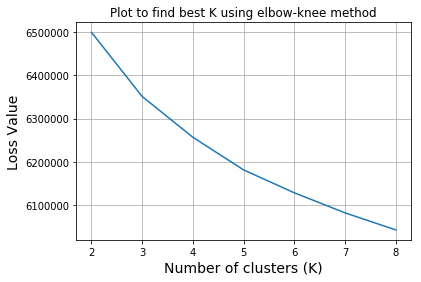

In [41]:
from sklearn.cluster import KMeans
k_values = [2,3,4,5,6,7,8]
loss = []
for i in k_values:
    kmeans = KMeans(n_clusters=i, random_state=0, n_jobs=-1).fit(X_new)
    loss.append(kmeans.inertia_)
plt.plot(k_values, loss)
plt.xlabel('Number of clusters (K)',size=14)
plt.ylabel('Loss Value',size=14)
plt.title("Plot to find best K using elbow-knee method")
plt.grid()
plt.show()

In [42]:
optimal_k = 6

kmeans = KMeans(n_clusters=optimal_k, n_jobs=-1).fit(X_new)

In [43]:
print(kmeans.labels_.shape)

(50000,)


In [44]:
essays = X['essay'].values

cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []


for i in range(kmeans.labels_.shape[0]):
    if kmeans.labels_[i] == 0:
        cluster1.append(essays[i])
    elif kmeans.labels_[i] == 1:
        cluster2.append(essays[i])
    elif kmeans.labels_[i] == 2:
        cluster3.append(essays[i])
    elif kmeans.labels_[i] == 3:
        cluster4.append(essays[i])
    elif kmeans.labels_[i] == 4:
        cluster5.append(essays[i])
    elif kmeans.labels_[i] == 5:
        cluster6.append(essays[i])

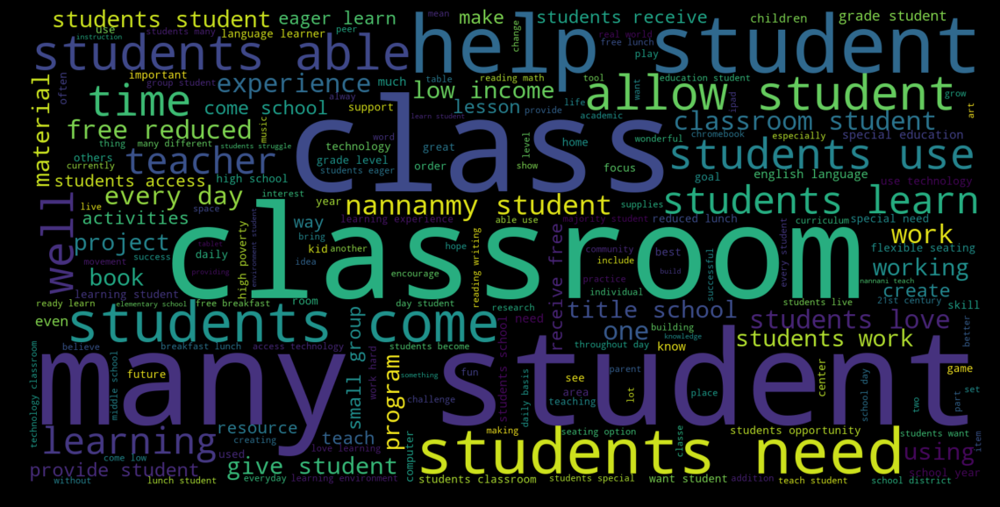

In [45]:
#cluster 1
words=''
for i in cluster1:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

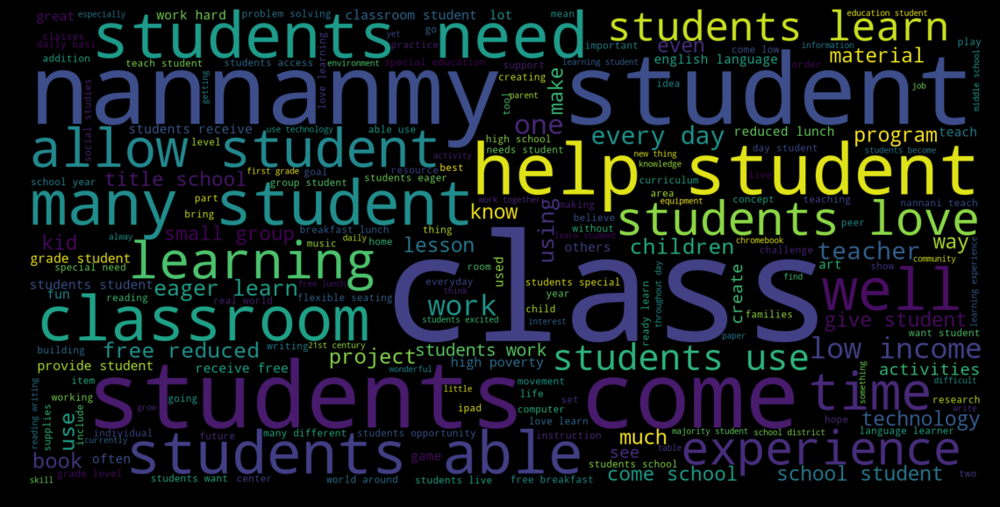

In [46]:
#cluster 2
words=''
for i in cluster2:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

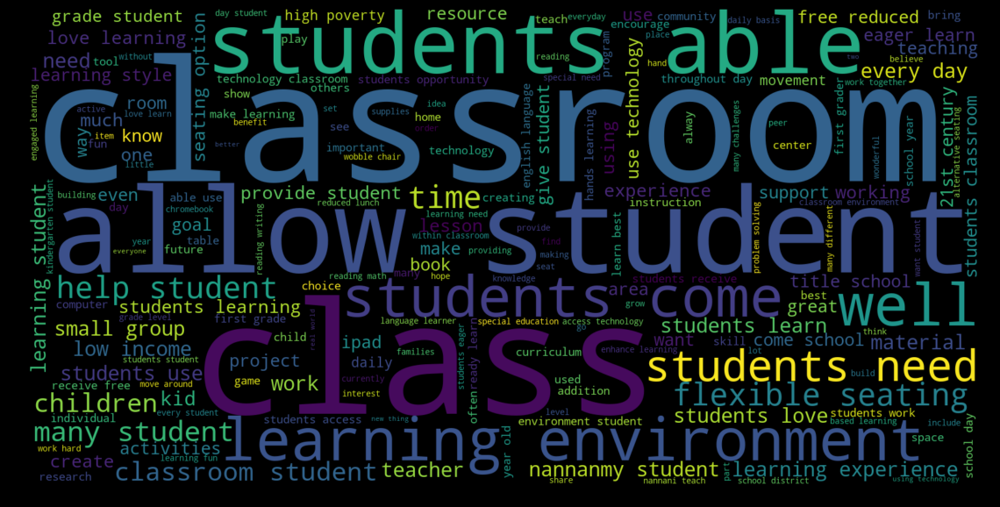

In [47]:
#cluster 3
words=''
for i in cluster3:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

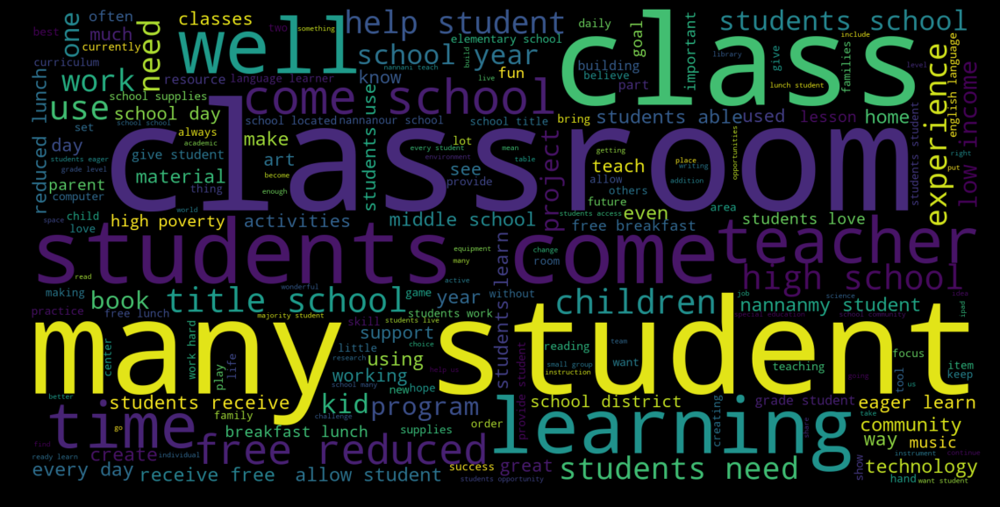

In [48]:
#cluster 4
words=''
for i in cluster4:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

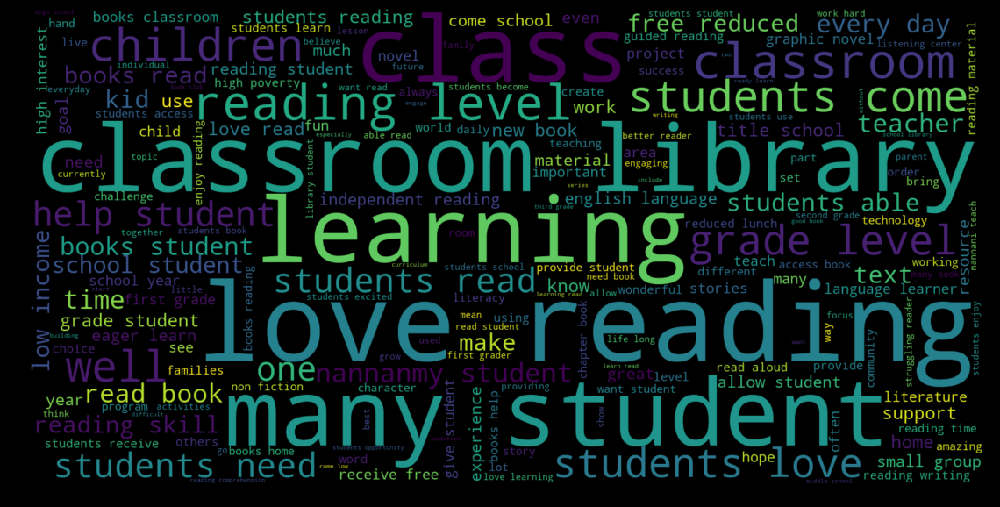

In [49]:
#cluster 5
words=''
for i in cluster5:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

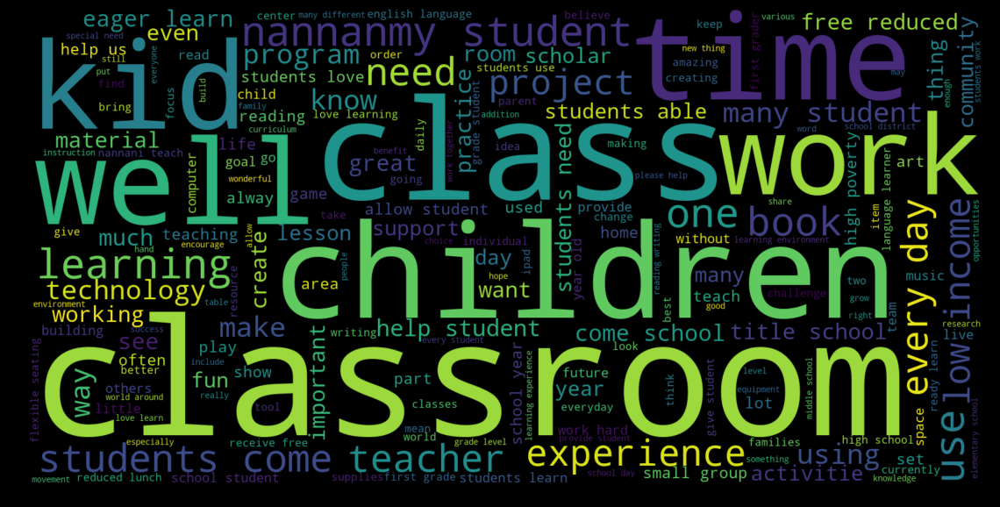

In [50]:
#cluster 6
words=''
for i in cluster6:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## 2.6 Apply AgglomerativeClustering

<h2>2.6.1 Dimensionality Reduction on the selected features </h2>

In [42]:
# using selectKBest we are find top 5k features


from sklearn.feature_selection import SelectKBest, chi2
t = SelectKBest(chi2,k=5000).fit(X_bow,y)
X_new = t.transform(X_bow)

print("="*100)

print("Final Data matrix on Bag of words")
print(X_new.shape)

print("="*100)

Final Data matrix on Bag of words
(50000, 5000)


In [43]:
X_tr = X_new[:5000]
X = X[:5000]

<h2> For K=2 </h2>

In [44]:
from sklearn.cluster import AgglomerativeClustering
aggcl=AgglomerativeClustering(n_clusters=2).fit(X_tr.toarray())

In [47]:
cluster1=[]
cluster2=[]
essays = X['essay'].values
for i in range(aggcl.labels_.shape[0]):
    if aggcl.labels_[i] == 0:
        cluster1.append(essays[i])
    elif aggcl.labels_[i] == 1:
        cluster2.append(essays[i])

In [48]:
for i in range(3):
    print('%s\n'%(cluster1[i]))

my students english learners working english second third languages we melting pot refugees immigrants native born americans bringing gift language school we 24 languages represented english learner program students every level mastery we also 40 countries represented families within school each student brings wealth knowledge experiences us open eyes new cultures beliefs respect the limits language limits world ludwig wittgenstein our english learner strong support system home begs resources many times parents learning read speak english along side children sometimes creates barriers parents able help child learn phonetics letter recognition reading skills by providing dvd players students able continue mastery english language even no one home able assist all families students within level 1 proficiency status offered part program these educational videos specially chosen english learner teacher sent home regularly watch the videos help child develop early reading skills parents not 

In [49]:
for i in range(3):
    print('%s\n'%(cluster2[i]))

true champions not always ones win guts by mia hamm this quote best describes students cholla middle school approach playing sports especially girls boys soccer teams the teams made 7th 8th grade students not opportunity play organized sport due family financial difficulties i teach title one middle school urban neighborhood 74 students qualify free reduced lunch many come activity sport opportunity poor homes my students love participate sports learn new skills apart team atmosphere my school lacks funding meet students needs i concerned lack exposure not prepare participating sports teams high school by end school year goal provide students opportunity learn variety soccer skills positive qualities person actively participates team the students campus come school knowing face uphill battle comes participating organized sports the players would thrive field confidence appropriate soccer equipment play soccer best abilities the students experience helpful person part team teaches posit

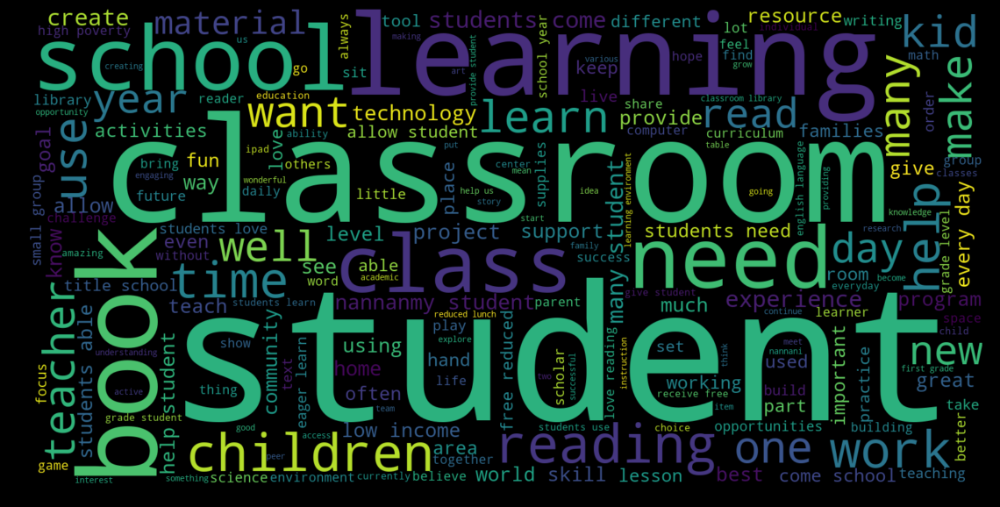

In [50]:
#cluster 1
words=''
for i in cluster1:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

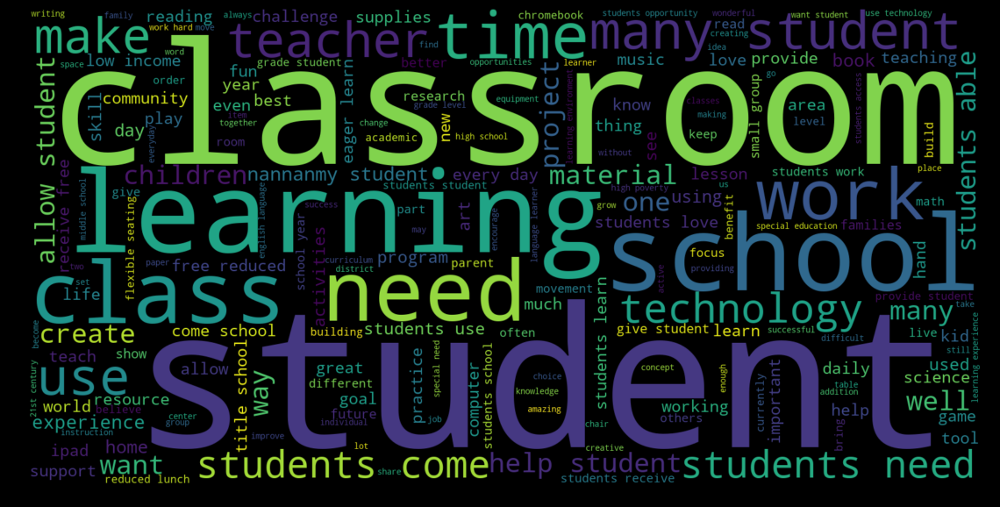

In [51]:
#cluster 1
words=''
for i in cluster2:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# For K=5

In [53]:
from sklearn.cluster import AgglomerativeClustering
aggcl=AgglomerativeClustering(n_clusters=5).fit(X_tr.toarray())

In [54]:
cluster1=[]
cluster2=[]
cluster3=[]
cluster4=[]
cluster5=[]
essays = X['essay'].values
for i in range(aggcl.labels_.shape[0]):
    if aggcl.labels_[i] == 0:
        cluster1.append(essays[i])
    elif aggcl.labels_[i] == 1:
        cluster2.append(essays[i])
    elif aggcl.labels_[i] == 2:
        cluster3.append(essays[i])
    elif aggcl.labels_[i] == 3:
        cluster4.append(essays[i])
    elif aggcl.labels_[i] == 4:
        cluster5.append(essays[i])

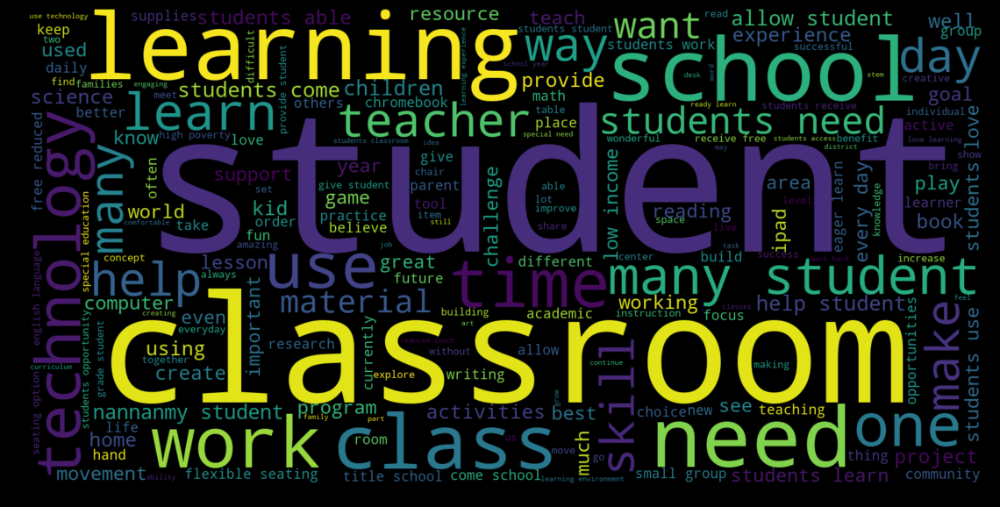

In [55]:
#cluster 1
words=''
for i in cluster1:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

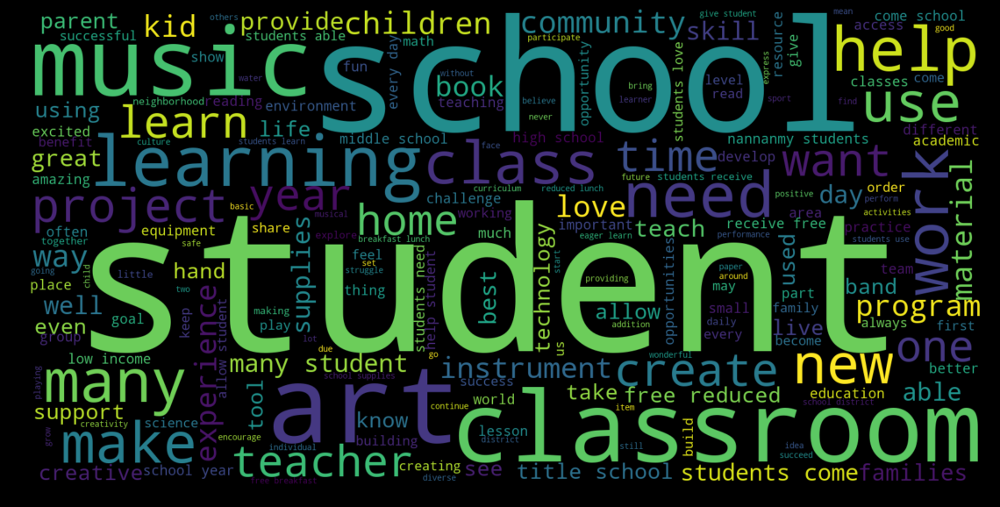

In [56]:
words=''
for i in cluster2:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

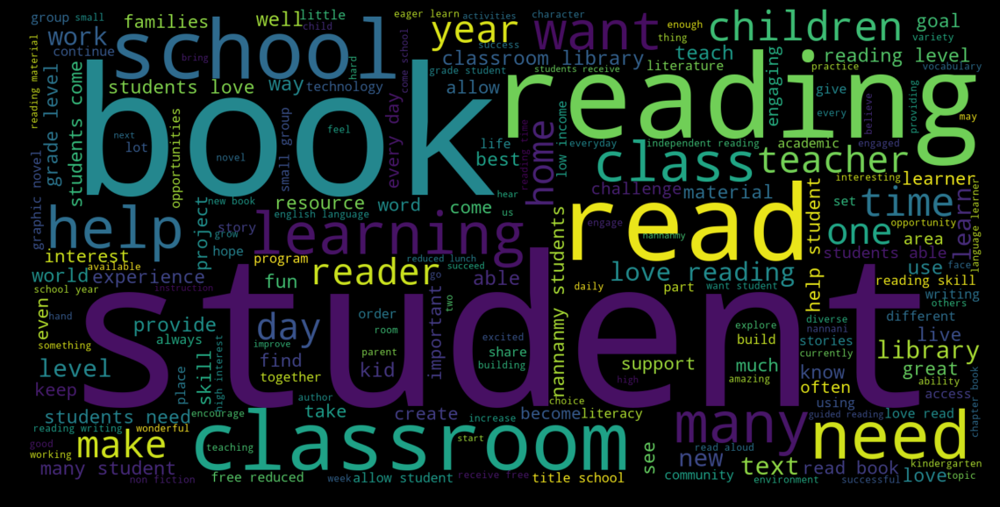

In [57]:
words=''
for i in cluster3:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

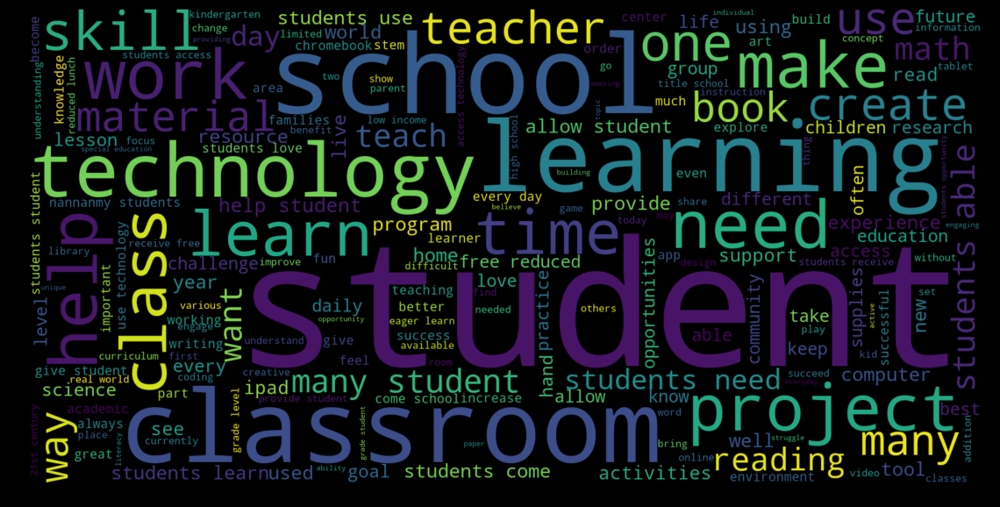

In [58]:
words=''
for i in cluster4:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

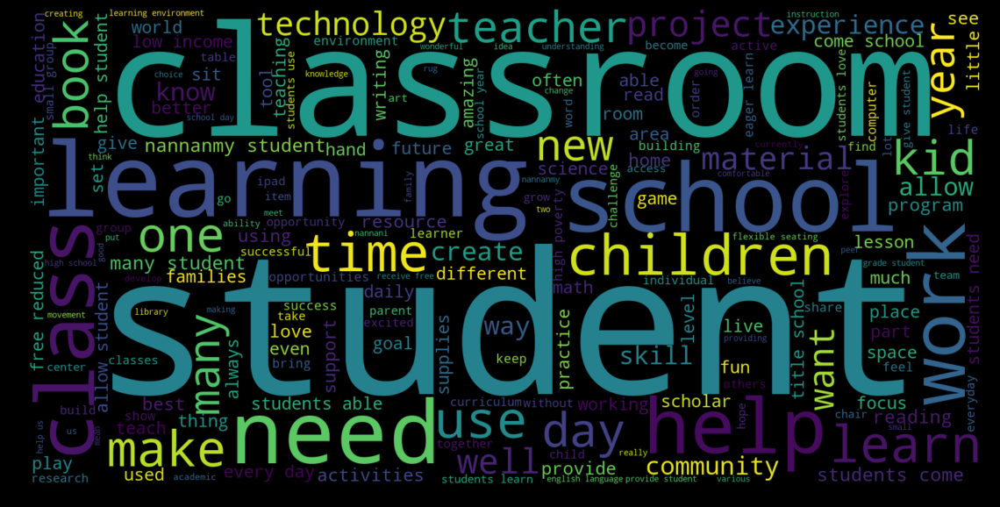

In [59]:
words=''
for i in cluster5:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# 2.7 Apply DBSCAN

In [68]:
# using selectKBest we are find top 5k features


from sklearn.feature_selection import SelectKBest, chi2
t = SelectKBest(chi2,k=5000).fit(X_bow,y)
X_new = t.transform(X_bow)

print("="*100)

print("Final Data matrix on Bag of words")
print(X_new.shape)

print("="*100)

Final Data matrix on Bag of words
(50000, 5000)


In [69]:
X_tr = X_new[:5000]
X = X[:5000]

In [70]:
from sklearn.preprocessing import StandardScaler
# dat=StandardScaler().fit_transform(X_tr.toarray())
dat=X_tr.toarray()
dat

array([[0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [63]:
from sklearn.metrics.pairwise import euclidean_distances
euclidean_distances(dat, dat[464].reshape(1, -1))

array([[26.26785107],
       [23.51595203],
       [31.41655614],
       ...,
       [23.        ],
       [31.51190251],
       [24.2693222 ]])

100%|██████████████████████████████████████████████████████████████████████████████| 5000/5000 [12:55<00:00,  7.58it/s]


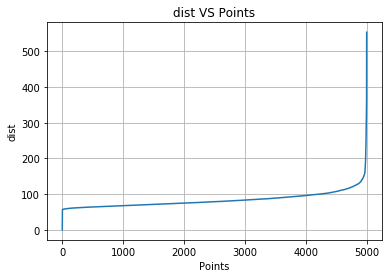

In [72]:


min_points = 1500
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import euclidean_distances
datt=StandardScaler().fit_transform(dat)
distance=[]
for point in tqdm(datt):
    temp = euclidean_distances(datt, point.reshape(1, -1))
    distance.append(temp[min_points])
sorted_distance = np.sort(np.array(distance))


sorted_dist = np.sort(sorted_distance.reshape(1,-1)[0])
points = [i for i in range(len(datt))]
# Draw distances(d_i) VS points(x_i) plot
plt.plot(points, sorted_dist)
plt.xlabel('Points')
plt.ylabel('dist')
plt.title('dist VS Points')
plt.grid()
plt.show()

In [73]:
#we can see that point of inflexion is at eps=9
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=90,n_jobs=-1)
dbscan.fit(datt)
print('No of clusters: ',len(set(dbscan.labels_)))
print('Cluster are including noise i.e -1: ',set(dbscan.labels_))

No of clusters:  2
Cluster are including noise i.e -1:  {0, -1}


In [74]:
#ignoring -1 as it is for noise
cluster1=[]
noisecluster1=[]
for i in range(dbscan.labels_.shape[0]):
    if dbscan.labels_[i] == 0:
        cluster1.append(essays[i])
    elif dbscan.labels_[i] == -1:
        noisecluster1.append(essays[i])

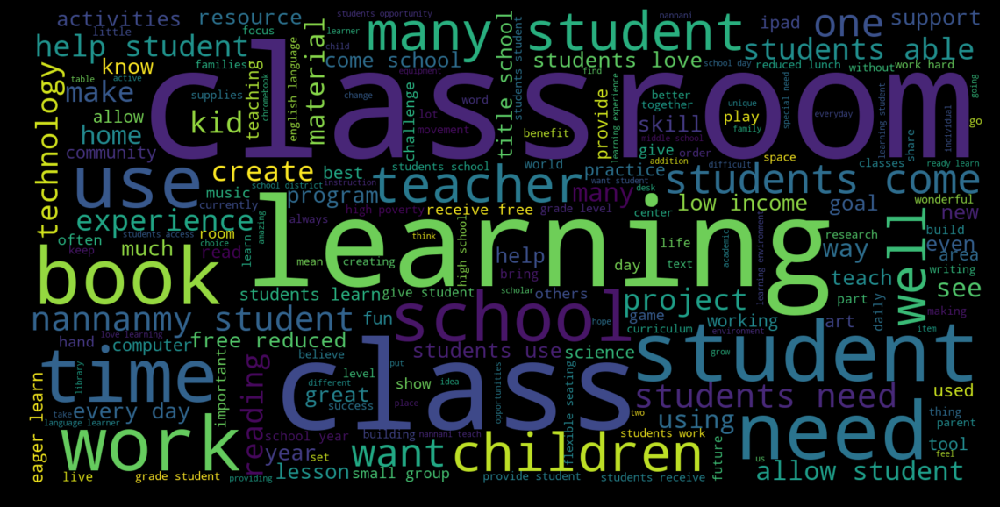

In [75]:
words=''
for i in cluster1:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

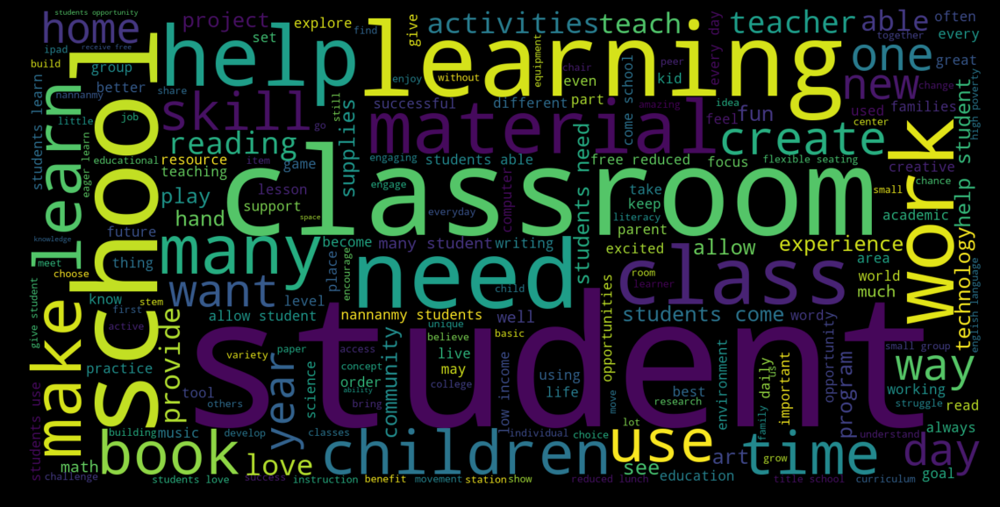

In [76]:
words=''
for i in noisecluster1:
    words+=str(i)
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800).generate(words)


# Display the generated image:
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# 3. Conclusions

## a. K-Means:

1.First we have done hyperparameter tuning of K_values with 2,3,4,5,6,7,8 and got the inflection point at k=6.

2.There after, we trained K-Means on K_value=6.

3.After training we clustered the essays into 6 seperate clusters.

4.And finally we plot the word cloud.

## b. Agglomerative:

1.First we reduced the dimensions to 5000 and also took 5000 points same as in K-Means.

2.Then we applied Agglomerative clustering on k=2.

3.Then clustered the essays into 2 seperate clusters.

4.After that we plotted the wordcloud for each of the clusters.

5.Then applied Agglomerative clustering on k=5.

6.Then we clustered the essays into 5 seperate clusters.

7.After that we plotted the wordcloud for each of the clusters

## c. DBScan:

1. Firstly we converted the reduced sparce matrix to dense using toarray().

2. Then we transformed the data to standard scalar.

3. Then we computed euclidean distance for every point to every other point and took the distance of min_pts.

4. Obtained the best eps to be 90 from the above graph b/w dist and points.

5. Then formed clusters on noise points and non-noise points.

6. Printed the essays in each of the two clusters.

7. Then printed the wordcloud.